In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

## Calculate Camera distortion based on 20 caliberation images provided.

In [2]:
nx=9
ny=6
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

img_size = (img.shape[1], img.shape[0])
# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None,None)


## Apply a distortion correction to raw images.

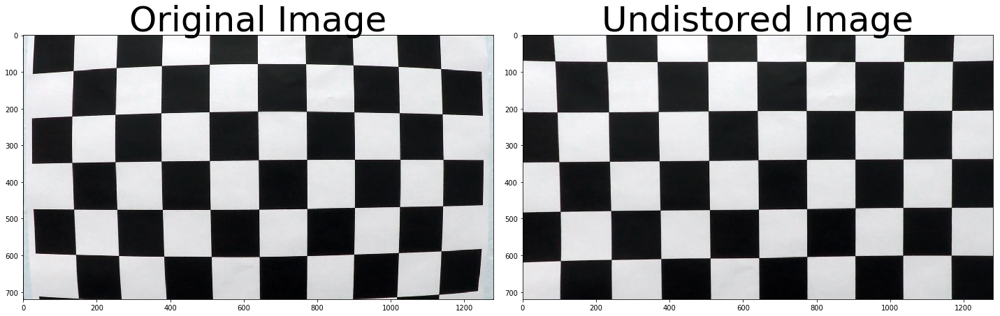

In [3]:
test_image = cv2.imread('camera_cal/calibration1.jpg')

dst = cv2.undistort(test_image, mtx, dist, None, mtx)
f, (ax1,ax2) = plt.subplots(1, 2, figsize=(20, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image',fontsize=50)
ax2.imshow(dst, cmap='gray')
ax2.set_title('Undistored Image',fontsize=50)
plt.savefig('output_images/undistored_image.png',bbox_inches='tight') 

# Find the Points for Perspective Transform

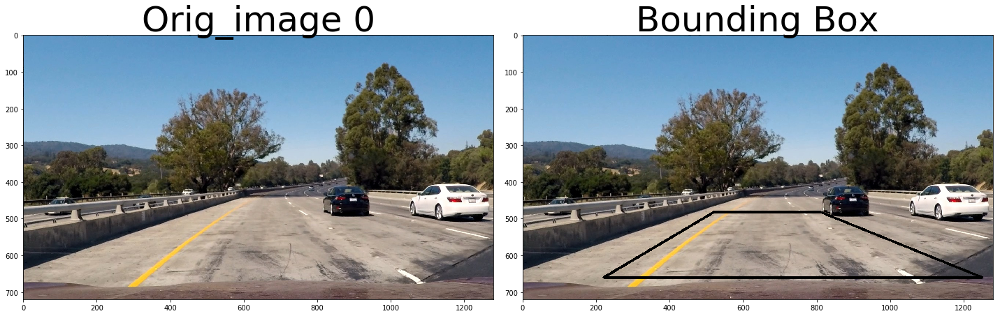

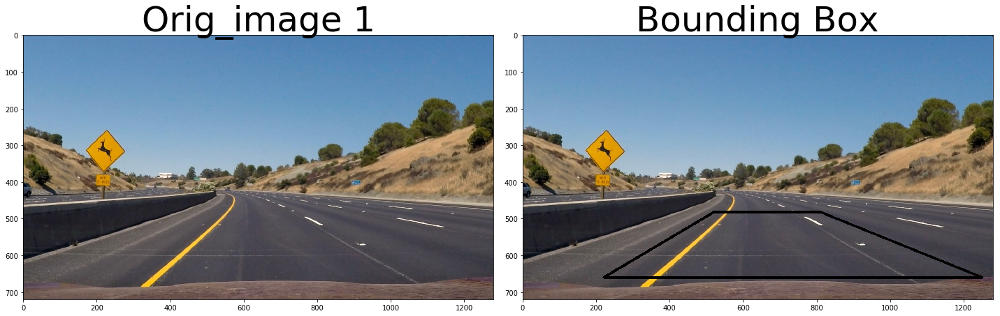

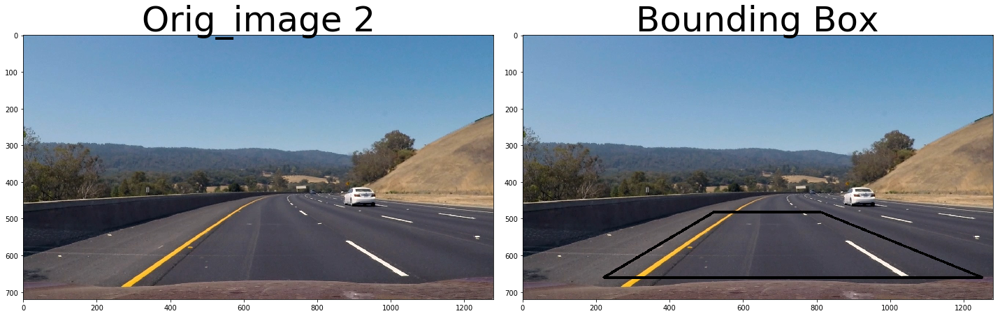

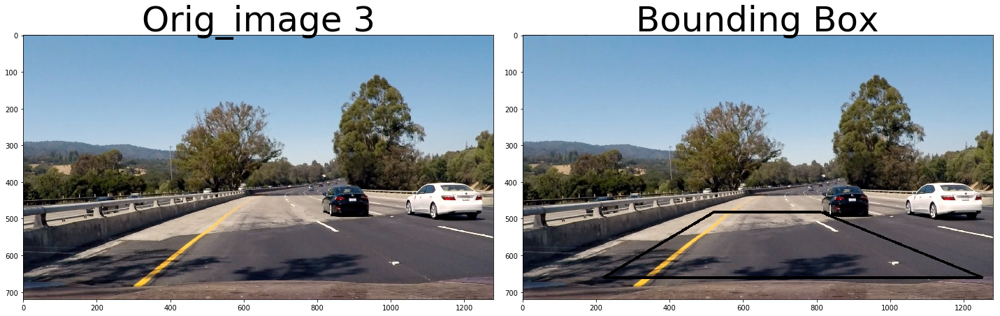

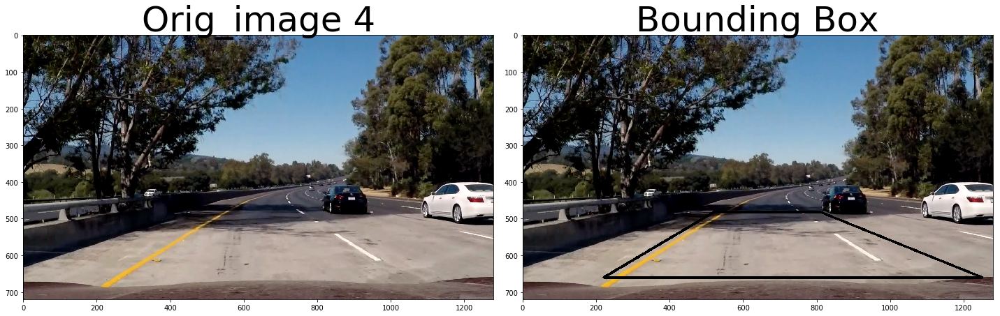

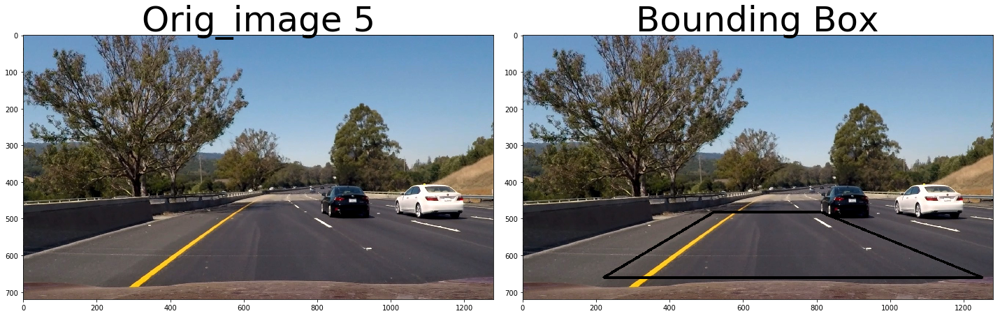

In [4]:
images = glob.glob('test_images/test*.jpg')
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    orig_img = np.copy(img)
    #points = [(575, 450), (700,450), (1075, 660), (255, 660)]
    points = [(520, 482), (810,482), (1250, 660), (220, 660)]
    #src = np.float32([[490, 482],[810, 482],
    #                  [1250, 720],[0, 720]])
    cv2.line(img, points[0], points[1], 0, 5)
    cv2.line(img, points[1], points[2], 0, 5)
    cv2.line(img, points[2], points[3], 0, 5)
    cv2.line(img, points[3], points[0], 0, 5)

    f, (ax1,ax2) = plt.subplots(1, 2, figsize=(20, 9))
    f.tight_layout()
    ax1.imshow(orig_img)
    ax1.set_title('Orig_image %d' %(idx), fontsize=50)
    ax2.imshow(img, cmap='gray')
    ax2.set_title('Bounding Box', fontsize=50)
    file_name = 'output_images/Bounding_box_img' + str(idx) + '.png'
    plt.savefig(file_name,bbox_inches='tight') 

# Get Perspective Transform

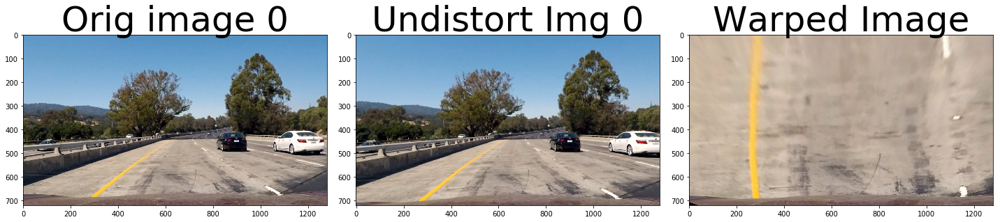

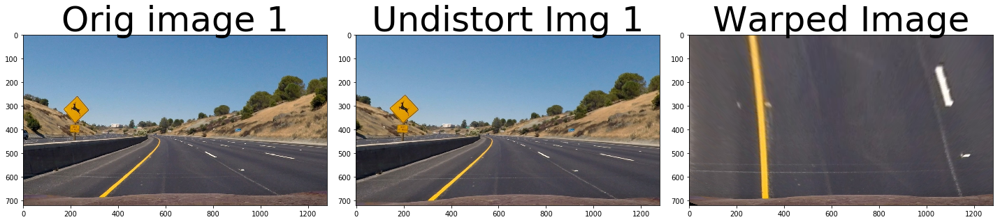

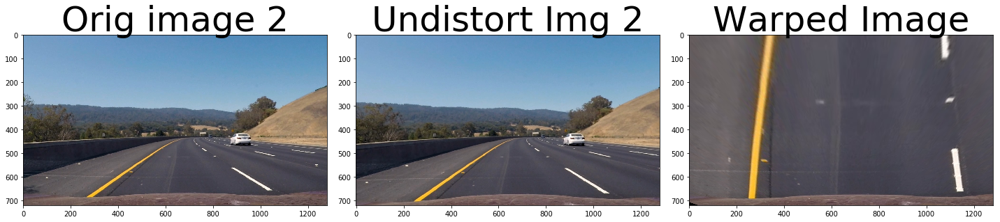

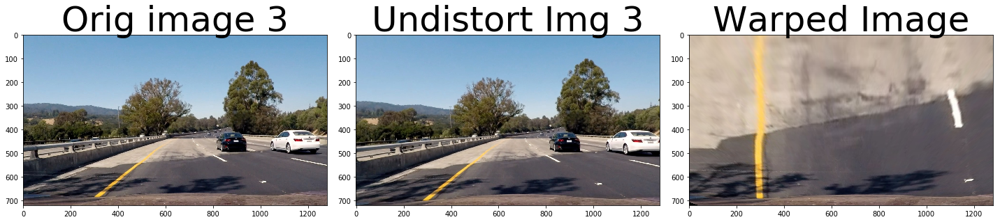

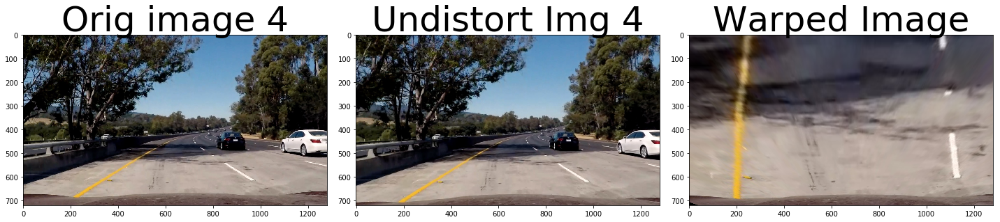

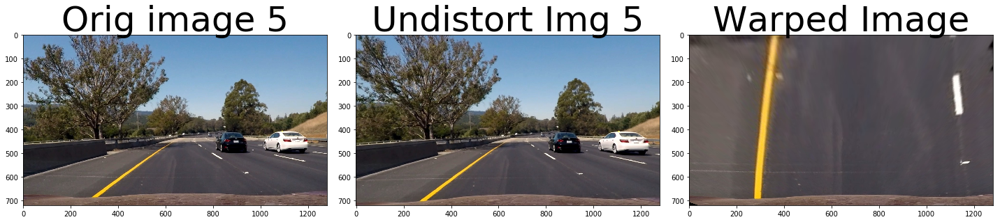

In [5]:
images = glob.glob('test_images/test*.jpg')

offset = 0 # offset for dst point
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    img_size = (img.shape[1], img.shape[0])
    #src = np.float32([[600, 450],[730, 450], [1150, 660], [250,660]])
    #src = np.float32([(550, 450), (760,450), (1150, 660), (250, 660)])
    #src = np.float32([(520, 482), (810,482), (1250, 660), (220, 660)])
    #dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
    #                             [img_size[0]-offset, img_size[1]-offset], 
    #                             [offset, img_size[1]-offset]])
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[0, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])

    undistort_img = cv2.undistort(img, mtx, dist, None, mtx)
    M = cv2.getPerspectiveTransform(src, dst)
    warped_img = cv2.warpPerspective(img, M, img_size)
    f, (ax1,ax2, ax3) = plt.subplots(1, 3, figsize=(20, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Orig image %d'%(idx), fontsize=50)
    ax2.imshow(undistort_img)
    ax2.set_title('Undistort Img %d'%(idx), fontsize=50)
    ax3.imshow(warped_img, cmap='gray')
    ax3.set_title('Warped Image', fontsize=50)
    file_name = 'output_images/undistored_warped_image' + str(idx) + '.png'
    plt.savefig(file_name,bbox_inches='tight') 


# Create a thresholded binary image

In [6]:
def get_undistored_perspective_image(image):
    offset =0
    img_size = (image.shape[1], image.shape[0])
    #src = np.float32([[600, 450],[730, 450], [1150, 660], [250,660]])
    #src = np.float32([(520, 450), (760,450), (1150, 660), (250, 660)])
    #src = np.float32([(520, 482), (810,482), (1250, 660), (220, 660)])
    
    #dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
    #                             [img_size[0]-offset, img_size[1]-offset], 
    #                             [offset, img_size[1]-offset]])
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[0, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    undistort_img = cv2.undistort(img, mtx, dist, None, mtx)
    M = cv2.getPerspectiveTransform(src, dst)
    warped_img = cv2.warpPerspective(img, M, img_size)
    return warped_img

In [7]:
def apply_new_thresh(warped):
    s_channel = cv2.cvtColor(warped, cv2.COLOR_BGR2HLS)[:,:,2]
    
    l_channel = cv2.cvtColor(warped, cv2.COLOR_BGR2LUV)[:,:,0]

    b_channel = cv2.cvtColor(warped, cv2.COLOR_BGR2Lab)[:,:,2]   

    # Threshold color channel
    s_thresh_min = 120
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    b_thresh_min = 155
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    l_thresh_min = 225
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1) | (s_binary ==1)] = 1
    
    return combined_binary

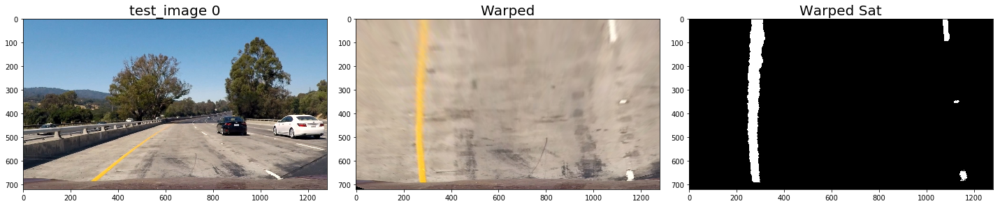

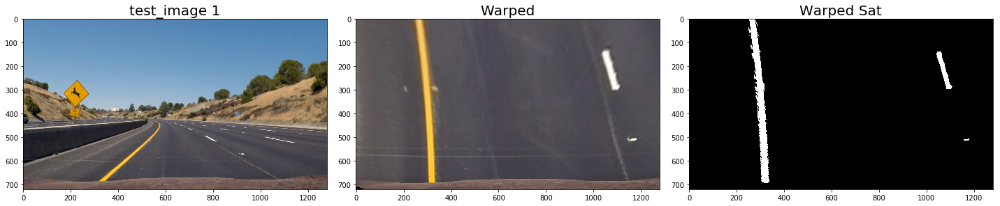

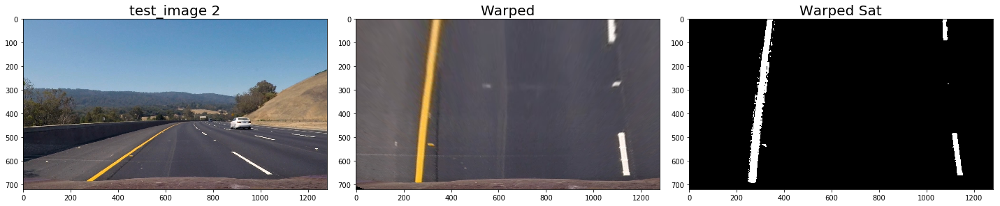

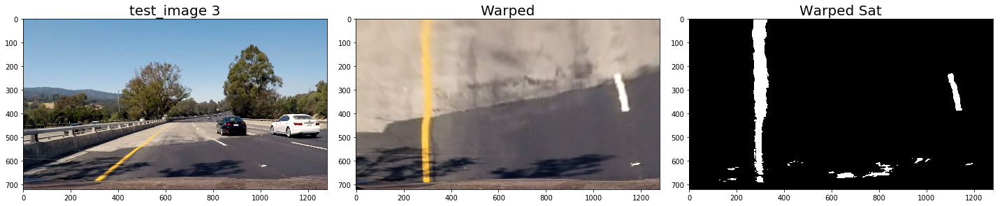

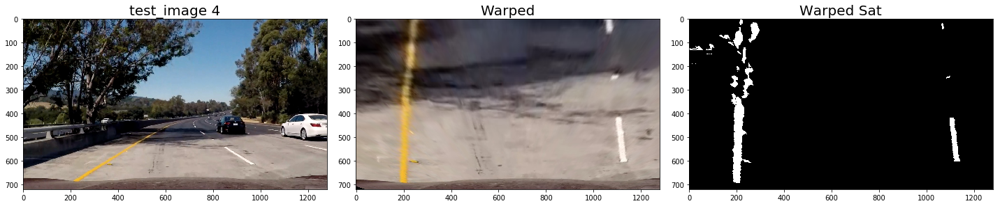

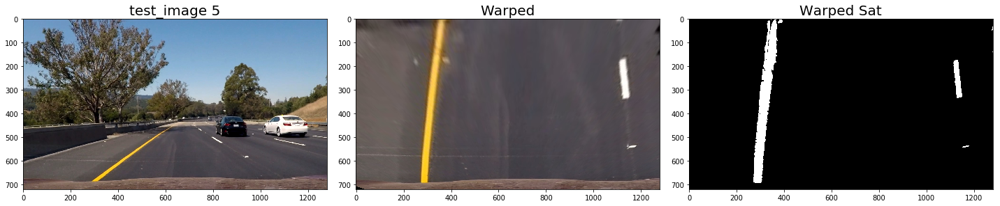

In [8]:
images = glob.glob('test_images/test*.jpg')
offset =0
ksize = 9
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
 
    warped_img = get_undistored_perspective_image(img)
    warped_thresh_img = apply_new_thresh(warped_img)
    
    f, (ax1,ax2, ax3) = plt.subplots(1, 3, figsize=(20, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('test_image %d' %(idx), fontsize=20)
    ax2.imshow(warped_img, cmap='gray')
    ax2.set_title('Warped', fontsize=20)
    ax3.imshow(warped_thresh_img, cmap='gray')
    ax3.set_title('Warped Sat', fontsize=20)
    
    file_name = 'output_images/threshold_image' + str(idx) + '.png'
    plt.savefig(file_name,bbox_inches='tight') 

# Plot Histogram

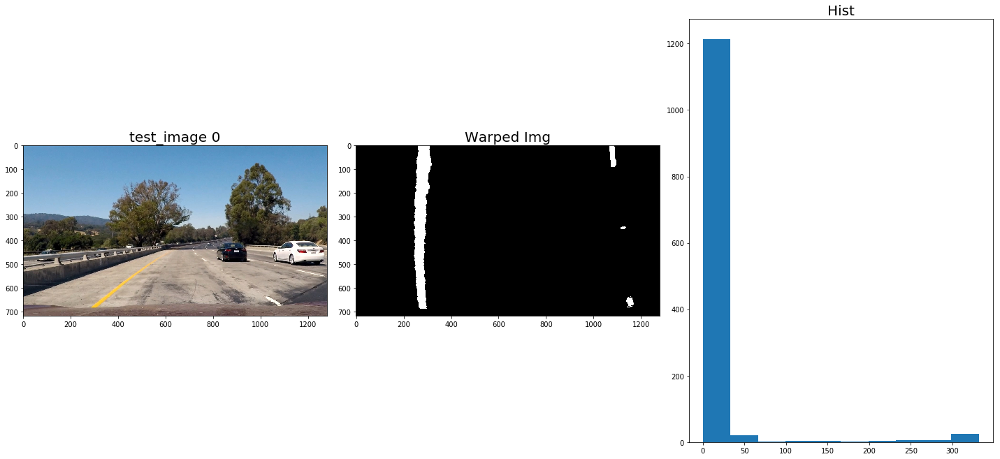

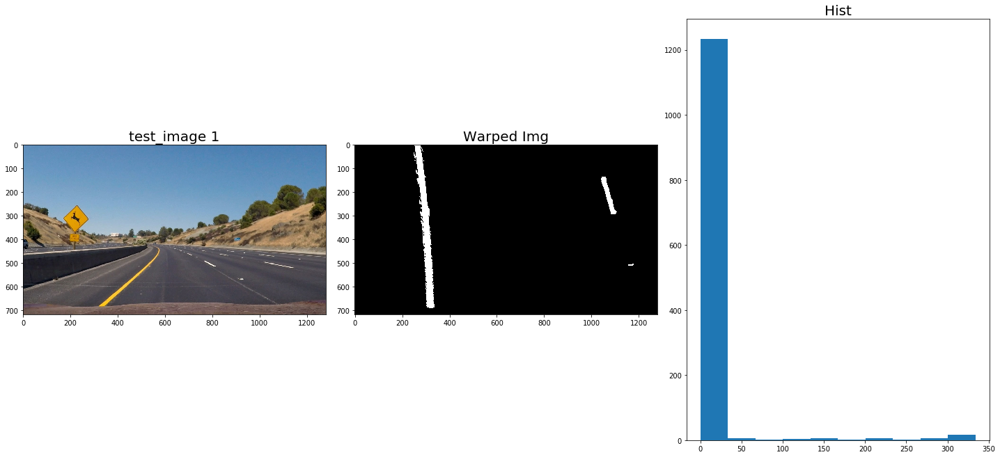

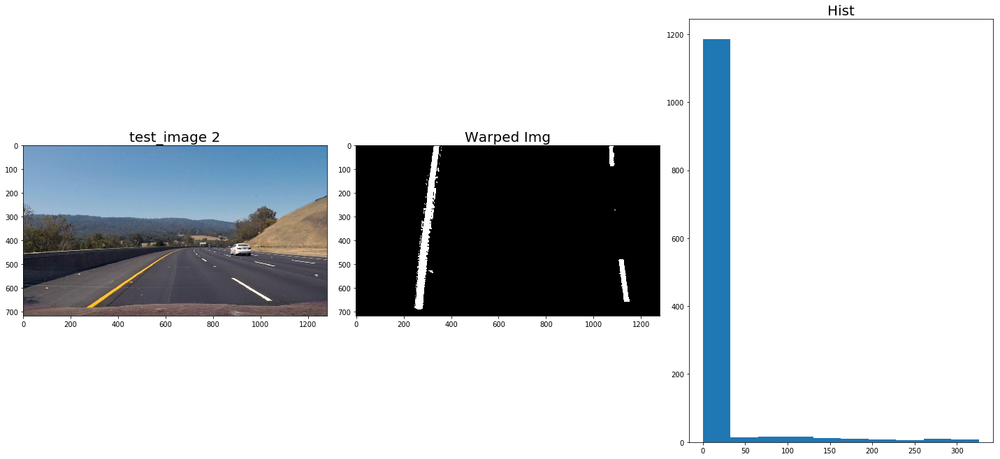

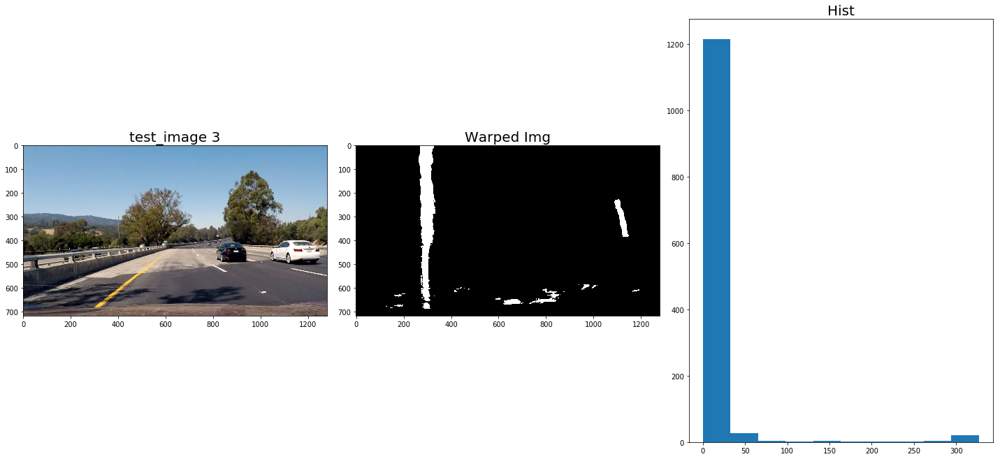

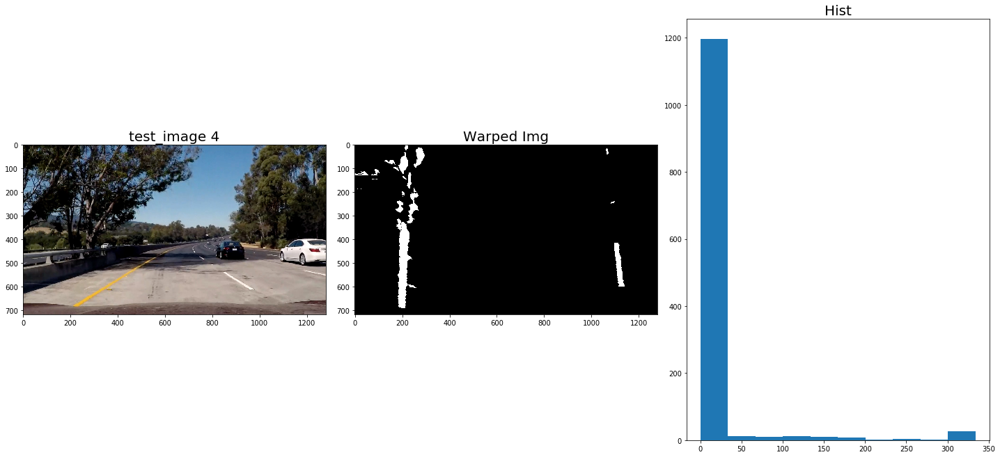

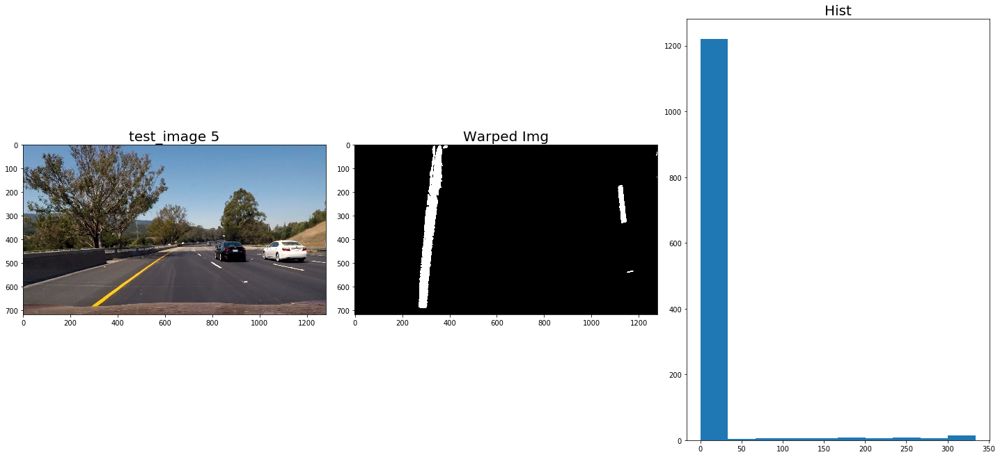

In [9]:
images = glob.glob('test_images/test*.jpg')
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    perspective_img = get_undistored_perspective_image(img)
    warped_thresh_img = apply_new_thresh(perspective_img)
    midpoint = int(warped_thresh_img.shape[0]/2)
    histogram = np.sum(warped_thresh_img[midpoint:,:], axis=0)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    f, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(20, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('test_image %d' %(idx), fontsize=20)
    ax2.imshow(warped_thresh_img,cmap='gray')
    ax2.set_title('Warped Img', fontsize=20)
    ax3.set_title('Hist', fontsize=20)
    ax3.hist(histogram)
    

In [10]:
from numpy.linalg import inv
def draw_result_lane(orig_image, combined_binary, left_fitx, rightx, ploty):
    Minv = inv(M)
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_(pts), (34,255,34))
    newwarp = cv2.warpPerspective(color_warp, Minv, (orig_image.shape[1], orig_image.shape[0]))
    result = cv2.addWeighted(orig_image, 1, newwarp, 0.5, 0)
    return result

# Single Image Pipeline For lane Polynomial Fit

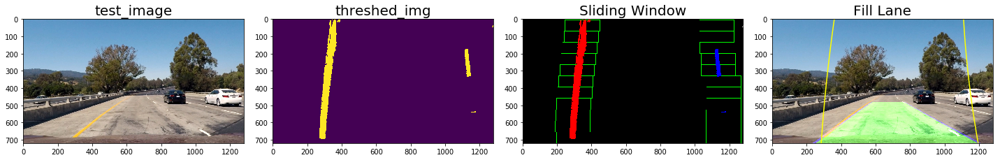

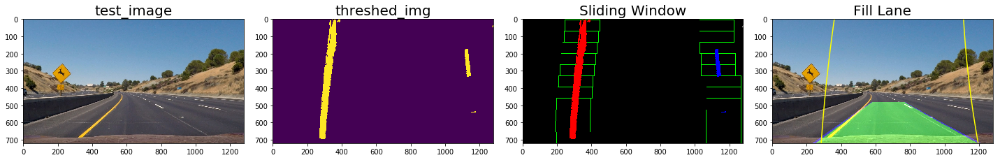

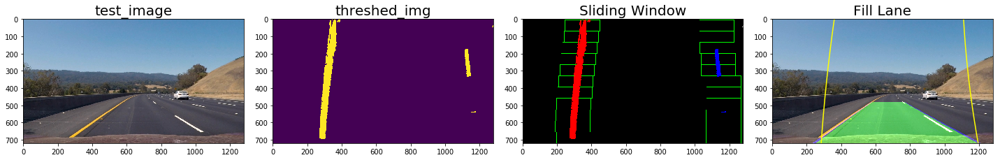

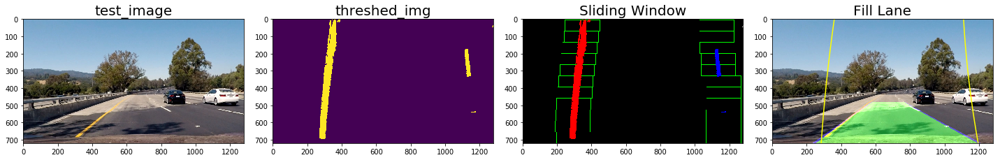

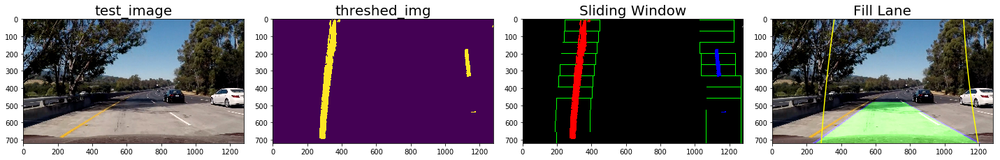

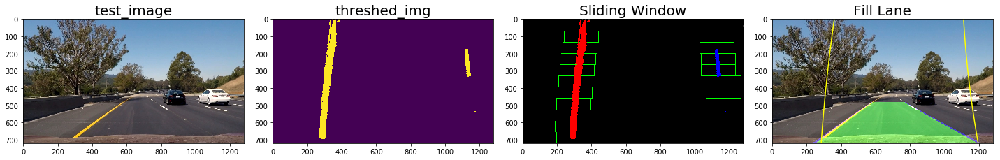

In [13]:
sliding_window_imgs = glob.glob('test_images/test*.jpg')
for idx, fname in enumerate(images):
    slid_img = mpimg.imread(fname)
    warped_slid_eye_img = get_undistored_perspective_image(slid_img)
    slid_warped_img = apply_new_thresh(warped_slid_eye_img)
    mid = int(slid_warped_img.shape[0]/2)
    slid_histo= np.sum(slid_warped_img[mid:,:], axis=0)
    leftx_base = np.argmax(slid_histo[:mid])
    rightx_base = np.argmax(slid_histo[mid:]) + mid
    
    out_img = np.dstack((slid_warped_img, slid_warped_img, slid_warped_img))*255
    # Choose the number of sliding windows
    nwindows = 11
    # Set height of windows
    window_height = np.int(slid_warped_img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = slid_warped_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = slid_warped_img.shape[0] - (window+1)*window_height
        win_y_high = slid_warped_img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
            (0,255,0), 2 )
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
            (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]

        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
     #Generate x and y values for plotting
    ploty = np.linspace(0, slid_warped_img.shape[0]-1, slid_warped_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    fill_lane = draw_result_lane(slid_img,slid_warped_img, left_fitx, right_fitx, ploty)
    
    f, (ax1,ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(20, 9))
    f.tight_layout()
    ax1.imshow(slid_img)
    ax1.set_title('test_image', fontsize=20)
    ax2.set_title('threshed_img', fontsize=20)
    ax2.imshow(slid_warped_img)
    ax3.set_title('Sliding Window', fontsize=20)
    ax3.imshow(out_img)
    ax4.set_title('Fill Lane', fontsize=20)
    ax4.imshow(fill_lane)

    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

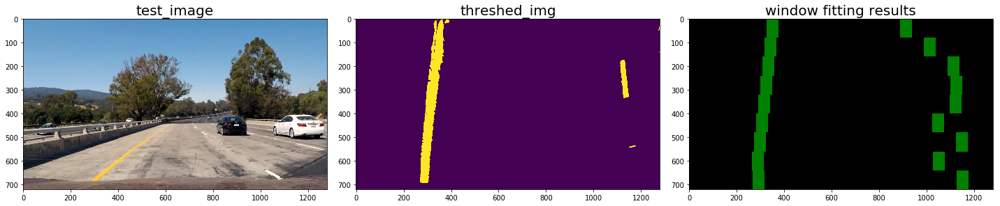

In [14]:
conv_slid_fname = 'test_images/test1.jpg'
# Read in a thresholded image
conv_slid_img = mpimg.imread(conv_slid_fname)
warped_conv_eye_img = get_undistored_perspective_image(conv_slid_img)
conv_slid_threshed_img = apply_new_thresh(warped_conv_eye_img)
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(conv_slid_threshed_img[int(3*conv_slid_threshed_img.shape[0]/4):,:int(conv_slid_threshed_img.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(conv_slid_threshed_img[int(3*conv_slid_threshed_img.shape[0]/4):,int(conv_slid_threshed_img.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(conv_slid_threshed_img.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(conv_slid_threshed_img.shape[0]/window_height)):
	    # convolve the window into the vertical slice of the image
	    image_layer = np.sum(conv_slid_threshed_img[int(conv_slid_threshed_img.shape[0]-(level+1)*window_height):int(conv_slid_threshed_img.shape[0]-level*window_height),:], axis=0)
	    conv_signal = np.convolve(window, image_layer)
	    # Find the best left centroid by using past left center as a reference
	    # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
	    offset = window_width/2
	    l_min_index = int(max(l_center+offset-margin,0))
	    l_max_index = int(min(l_center+offset+margin,conv_slid_threshed_img.shape[1]))
	    l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
	    # Find the best right centroid by using past right center as a reference
	    r_min_index = int(max(r_center+offset-margin,0))
	    r_max_index = int(min(r_center+offset+margin,conv_slid_threshed_img.shape[1]))
	    r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
	    # Add what we found for that layer
	    window_centroids.append((l_center,r_center))

    return window_centroids

window_centroids = find_window_centroids(conv_slid_threshed_img, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(conv_slid_threshed_img)
    r_points = np.zeros_like(conv_slid_threshed_img)

    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
	    l_mask = window_mask(window_width,window_height,conv_slid_threshed_img,window_centroids[level][0],level)
	    r_mask = window_mask(window_width,window_height,conv_slid_threshed_img,window_centroids[level][1],level)
	    # Add graphic points from window mask here to total pixels found 
	    l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
	    r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channel
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage = np.array(cv2.merge((conv_slid_threshed_img,conv_slid_threshed_img,conv_slid_threshed_img)),np.uint8) # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
 
# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((conv_slid_threshed_img,conv_slid_threshed_img,conv_slid_threshed_img)),np.uint8)

f, (ax1,ax2,ax3) = plt.subplots(1, 3, figsize=(20, 9))
f.tight_layout()
ax1.imshow(conv_slid_img)
ax1.set_title('test_image', fontsize=20)
ax2.set_title('threshed_img', fontsize=20)
ax2.imshow(conv_slid_threshed_img)
ax3.set_title('window fitting results', fontsize=20)
ax3.imshow(output)


In [29]:
def fit_polynomial(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 11
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
            (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
            (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]


    return left_fitx,right_fitx,ploty, left_fit, right_fit

# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
def extend_the_poly(binar_image,left_fit, right_fit):
    nonzero = binar_image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binar_image.shape[0]-1, binar_image.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    return left_fitx, right_fitx,ploty

[  5.22141643e-05  -1.43045592e-01   3.60504237e+02] [  8.49898684e-05   5.63685780e-02   1.11046024e+03]
[  5.22141643e-05  -1.43045592e-01   3.60504237e+02] [  8.49898684e-05   5.63685780e-02   1.11046024e+03]
[  5.22141643e-05  -1.43045592e-01   3.60504237e+02] [  8.49898684e-05   5.63685780e-02   1.11046024e+03]
[  5.22141643e-05  -1.43045592e-01   3.60504237e+02] [  8.49898684e-05   5.63685780e-02   1.11046024e+03]
[  5.22141643e-05  -1.43045592e-01   3.60504237e+02] [  8.49898684e-05   5.63685780e-02   1.11046024e+03]
[  5.22141643e-05  -1.43045592e-01   3.60504237e+02] [  8.49898684e-05   5.63685780e-02   1.11046024e+03]


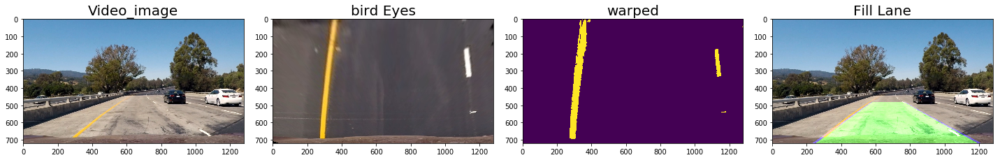

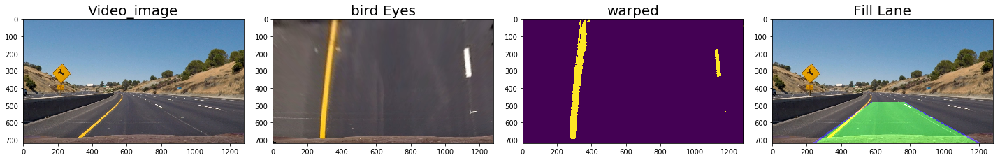

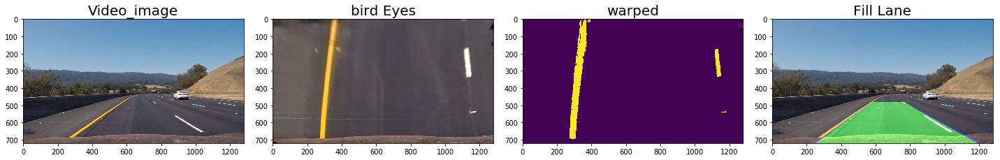

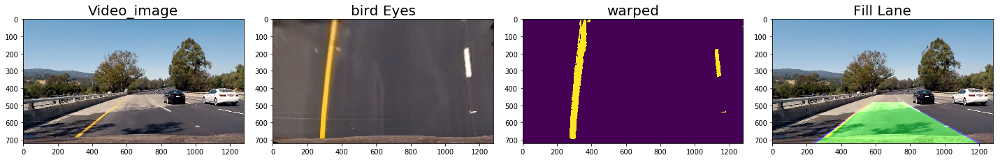

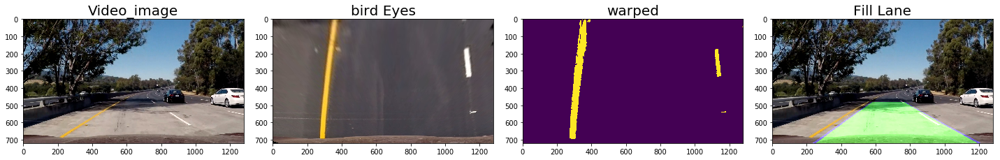

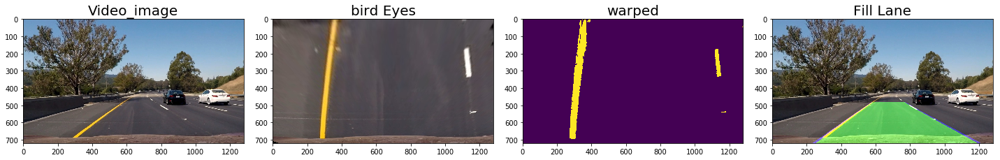

In [30]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import os
movie = 'project_video.mp4'
times = 0.1, 0.63, 0.947, 1.2, 3.8, 6.7
imgdir = './video_images/'
clip = VideoFileClip(movie)
for t in times:
    imgpath = os.path.join(imgdir, '{}.png'.format(t))
    clip.save_frame(imgpath, t)
    
video_imgs = glob.glob('video_images/*.png')

for idx, fname in enumerate(images):
    vid_img = mpimg.imread(fname)
    vid_bird_eye_img = get_undistored_perspective_image(vid_img)
    vid_warped_img = apply_new_thresh(vid_bird_eye_img)
    left_fitx, right_fitx, ploty, left_fit, right_fit = fit_polynomial(vid_warped_img)
    fill_lane = draw_result_lane(vid_img,vid_warped_img, left_fitx, right_fitx, ploty)
    print(left_fit, right_fit)
    f, (ax1,ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(20, 9))
    f.tight_layout()
    ax1.imshow(vid_img)
    ax1.set_title('Video_image', fontsize=20)
    ax2.set_title('bird Eyes', fontsize=20)
    ax2.imshow(vid_bird_eye_img)
    ax3.set_title('warped', fontsize=20)
    ax3.imshow(vid_warped_img)
    ax4.set_title('Fill Lane', fontsize=20)
    ax4.imshow(fill_lane)

In [31]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_left_fit = None
        self.current_right_fit = None
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
Left = Line()
Right = Line()

In [32]:
def process_video(video_img):
    #warped_img = get_undistored_perspective_image(img)
    vid_bird_eye_img = get_undistored_perspective_image(video_img)
    vid_warped_img = apply_new_thresh(vid_bird_eye_img)
    if (Left.detected == False or Right.detected == False):
        left_fitx, right_fitx, ploty, left_fit, right_fit= fit_polynomial(vid_warped_img)
        Left.detected = True
        Left.current_left_fit = left_fit
        Left.current_right_fit = right_fit
        Left.allx = left_fitx
        Left.ally = ploty
        Right.detected = True
        Right.allx = right_fitx
        Right.ally = ploty
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*np.max(ploty) + fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        Right.curvead = Left.curvead = curverad
    else:
        left_fitx, right_fitx,ploty = extend_the_poly(vid_warped_img,Left.current_left_fit, Left.current_right_fit)
        if(np.sum(left_fitx) > 0 and np.sum(right_fitx) > 0):
            Left.allx = left_fitx
            Left.ally = ploty
            Right.allx = right_fitx
            Right.ally = ploty
        else :
            left_fitx, right_fitx, ploty, left_fit, right_fit = fit_polynomial(vid_warped_img)
            Left.detected = True
            Left.current_left_fit = left_fit
            Left.current_right_fit = right_fit
            Left.allx = left_fitx
            Left.ally = ploty
            Right.detected = True
            Right.allx = right_fitx
            Right.ally = ploty              
    
    filled_lane = draw_result_lane(video_img,vid_warped_img, left_fitx, right_fitx, ploty)
    return filled_lane

In [39]:
output = 'laneDetectedVideo_5.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(0,1)
white_clip = clip1.fl_image(process_video) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video laneDetectedVideo_5.mp4
[MoviePy] Writing video laneDetectedVideo_5.mp4


 96%|█████████▌| 25/26 [00:03<00:00,  7.46it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: laneDetectedVideo_5.mp4 

CPU times: user 5.12 s, sys: 580 ms, total: 5.7 s
Wall time: 4.21 s


In [40]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))